


# Generative adversarial networks



In [ ]:
import os
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import torch
import torch.nn as nn
import cv2
from tqdm.notebook import tqdm
from torchvision.utils import save_image
from torchvision.utils import make_grid
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set(style='darkgrid', font_scale=1.2)

## Prepare data

We will be using [Flickr Faces](https://github.com/NVlabs/ffhq-dataset) to train our model. Dataset consists of high-quality PNG images of people's faces. 

First, construct a dataloader and move it to device. The images will be shrinked to 128x128 for convenience.

In [3]:
def get_dataloader(image_size, batch_size):
    
    transform = tt.Compose([tt.Resize(image_size),
                          tt.ToTensor(),
                          tt.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
    dataset = ImageFolder(path, transform)
    dataloader = DataLoader(dataset, batch_size, shuffle=True, num_workers=2, pin_memory=True)
  
    return dataloader
 

In [4]:
image_size = 128
batch_size = 64
path = '/kaggle/input'


train_dl = get_dataloader(image_size,batch_size)
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [5]:
device

device(type='cuda')

In [6]:
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [7]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

Let's take a look at our images

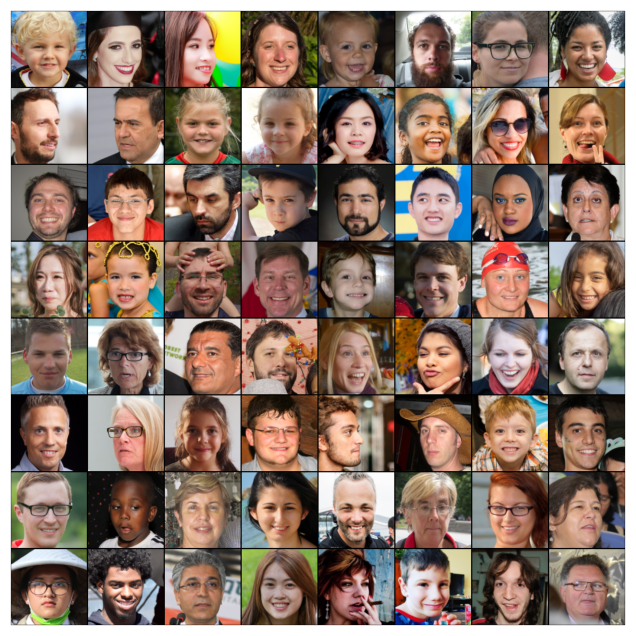

In [8]:
show_batch(train_dl)

## Build GAN

A GAN consists of two opposing networks: a *generator*, whose task is to learn to generate images similar to the training sample from random noise, and a *discriminator*, which learns to recognize whether the image is real or generated by the generator.

In [9]:
discriminator = nn.Sequential(
    # in: 3 x 128 x 128

    nn.Conv2d(3, image_size, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(image_size),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 64 x 64

    nn.Conv2d(image_size, image_size*2, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(image_size*2),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 32 x 32

    nn.Conv2d(image_size*2, image_size*4, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(image_size*4),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 16 x 16

    nn.Conv2d(image_size*4, image_size*8, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(image_size*8),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 1024 x 8 x 8

    nn.Conv2d(image_size*8, 1, kernel_size=4, stride=5, padding=0, bias=False),         
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [10]:
#!pip install torchsummary

In [11]:
from torchsummary import summary
summary(discriminator.cuda(), (3, image_size, image_size))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 128, 64, 64]           6,144
       BatchNorm2d-2          [-1, 128, 64, 64]             256
         LeakyReLU-3          [-1, 128, 64, 64]               0
            Conv2d-4          [-1, 256, 32, 32]         524,288
       BatchNorm2d-5          [-1, 256, 32, 32]             512
         LeakyReLU-6          [-1, 256, 32, 32]               0
            Conv2d-7          [-1, 512, 16, 16]       2,097,152
       BatchNorm2d-8          [-1, 512, 16, 16]           1,024
         LeakyReLU-9          [-1, 512, 16, 16]               0
           Conv2d-10           [-1, 1024, 8, 8]       8,388,608
      BatchNorm2d-11           [-1, 1024, 8, 8]           2,048
        LeakyReLU-12           [-1, 1024, 8, 8]               0
           Conv2d-13              [-1, 1, 1, 1]          16,384
          Flatten-14                   

In [12]:
latent_size = 256 # latent size (should be not too small and not too big)

In [13]:
generator = nn.Sequential(
    
    nn.ConvTranspose2d(latent_size, image_size*16, kernel_size=4, stride=1, padding=1, bias=False),
    nn.BatchNorm2d(image_size*16),
    nn.LeakyReLU(0.2, inplace=True),
    
    nn.ConvTranspose2d(image_size*16, image_size*8, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(image_size*8),
    nn.LeakyReLU(0.2, inplace=True),

    nn.ConvTranspose2d(image_size*8, image_size*4, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(image_size*4),
    nn.LeakyReLU(0.2, inplace=True),

    nn.ConvTranspose2d(image_size*4, image_size*2, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(image_size*2),
    nn.LeakyReLU(0.2, inplace=True),

    nn.ConvTranspose2d(image_size*2, image_size, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(image_size),
    nn.LeakyReLU(0.2, inplace=True),

    nn.ConvTranspose2d(image_size, 3, kernel_size=4, stride=4, padding=0, bias=False),
    nn.Tanh())

In [14]:
summary(generator.cuda(), (latent_size, 1, 1))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1           [-1, 2048, 2, 2]       8,388,608
       BatchNorm2d-2           [-1, 2048, 2, 2]           4,096
         LeakyReLU-3           [-1, 2048, 2, 2]               0
   ConvTranspose2d-4           [-1, 1024, 4, 4]      33,554,432
       BatchNorm2d-5           [-1, 1024, 4, 4]           2,048
         LeakyReLU-6           [-1, 1024, 4, 4]               0
   ConvTranspose2d-7            [-1, 512, 8, 8]       8,388,608
       BatchNorm2d-8            [-1, 512, 8, 8]           1,024
         LeakyReLU-9            [-1, 512, 8, 8]               0
  ConvTranspose2d-10          [-1, 256, 16, 16]       2,097,152
      BatchNorm2d-11          [-1, 256, 16, 16]             512
        LeakyReLU-12          [-1, 256, 16, 16]               0
  ConvTranspose2d-13          [-1, 128, 32, 32]         524,288
      BatchNorm2d-14          [-1, 128,

In [ ]:
# discriminator = to_device(discriminator, device)
# generator = to_device(generator, device)

## Training

The default training algorithm is as follows:
1. Training the discriminator:
  * take real images and assign label 1 to them
  * generate images with the generator and assign them label 0
  * train the classifier for two classes

2. Training the generator:
  * generate images by generator and assign label 0 to them
  * predict with the discriminator whether the image is real or not


Details on current implementation: 

* Use of label smoothing (soft lables) -- values slightly more or less than 1.0 or slightly more than 0.0 for real and fake images respectively, where the variation for each image is random.
* Loss -- cross-entropy 
* Epochs -- 40 (more is desirable though)

In [15]:
lr = 0.0002
epochs = 40

model = {
    "discriminator": discriminator.to(device),
    "generator": generator.to(device)
}

criterion = {
    "discriminator": nn.BCELoss(),
    "generator": nn.BCELoss()
}

In [16]:
def fit(model, criterion, epochs, lr, start_idx=1):
    model["discriminator"].train()
    model["generator"].train()
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    optimizer = {
        "discriminator": torch.optim.Adam(model["discriminator"].parameters(), 
                                          lr=lr, betas=(0.5, 0.999)),
        "generator": torch.optim.Adam(model["generator"].parameters(),
                                      lr=lr, betas=(0.5, 0.999))
    }
    
    for epoch in range(epochs):
        loss_d_per_epoch = []
        loss_g_per_epoch = []
        real_score_per_epoch = []
        fake_score_per_epoch = []
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            real_images = real_images.to(device)
            # Clear discriminator gradients
            optimizer["discriminator"].zero_grad()

            # Pass real images through discriminator
            real_preds = model["discriminator"](real_images)
            real_targets = torch.FloatTensor(real_images.size(0), 1).uniform_(0.95, 1.0).to(device)
            real_loss = criterion["discriminator"](real_preds, real_targets)
            cur_real_score = torch.mean(real_preds).item()
            
            # Generate fake images
            latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
            fake_images = model["generator"](latent)

            # Pass fake images through discriminator
            fake_targets = torch.FloatTensor(fake_images.size(0), 1).uniform_(0.0, 0.05).to(device)
            fake_preds = model["discriminator"](fake_images)
            fake_loss = criterion["discriminator"](fake_preds, fake_targets)
            cur_fake_score = torch.mean(fake_preds).item()

            real_score_per_epoch.append(cur_real_score)
            fake_score_per_epoch.append(cur_fake_score)

            # Update discriminator weights
            loss_d = real_loss + fake_loss
            loss_d.backward()
            optimizer["discriminator"].step()
            loss_d_per_epoch.append(loss_d.item())


            # Train generator
            # Clear generator gradients
            optimizer["generator"].zero_grad()
            
            # Generate fake images
            latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
            fake_images = model["generator"](latent)
            
            # Try to fool the discriminator
            preds = model["discriminator"](fake_images)
            targets = torch.FloatTensor(batch_size, 1).uniform_(0.95, 1.0).to(device)
            loss_g = criterion["generator"](preds, targets)
            
            # Update generator weights
            loss_g.backward()
            optimizer["generator"].step()
            loss_g_per_epoch.append(loss_g.item())
            
        # Record losses & scores
        losses_g.append(np.mean(loss_g_per_epoch))
        losses_d.append(np.mean(loss_d_per_epoch))
        real_scores.append(np.mean(real_score_per_epoch))
        fake_scores.append(np.mean(fake_score_per_epoch))
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, 
            losses_g[-1], losses_d[-1], real_scores[-1], fake_scores[-1]))
    
        # Save generated images
#         if epoch == epochs - 1:
#             save_samples(epoch+start_idx, fixed_latent, show=False)
            
        # Print generative progress
        plt.figure(figsize=(12,12))
        plt.axis("off")
        plt.title("Generated Images")
        plt.imshow(np.transpose(make_grid(fake_images.to(device)[:8], padding=2, normalize=True).cpu(),(1,2,0)))
        plt.show()
    
    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
#!pip install ipywidgets

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [1/40], loss_g: 3.6826, loss_d: 0.8503, real_score: 0.7834, fake_score: 0.2306


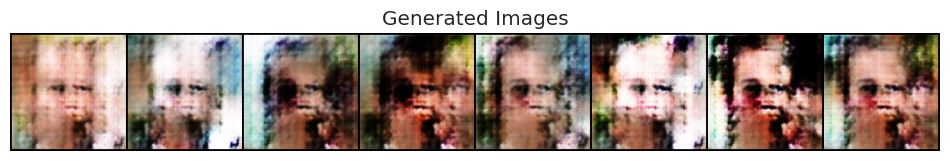

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [2/40], loss_g: 3.3336, loss_d: 0.7719, real_score: 0.7777, fake_score: 0.2216


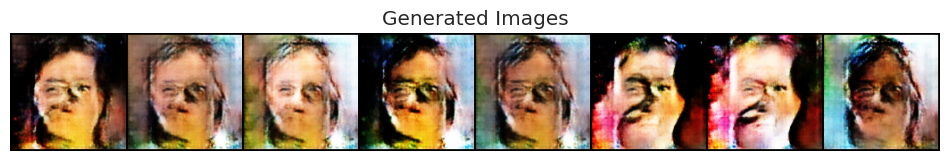

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [3/40], loss_g: 3.4144, loss_d: 0.6753, real_score: 0.8071, fake_score: 0.1930


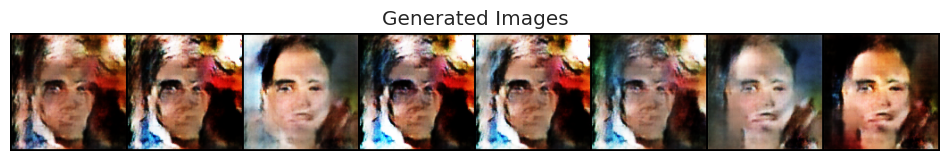

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [4/40], loss_g: 3.7808, loss_d: 0.5783, real_score: 0.8409, fake_score: 0.1593


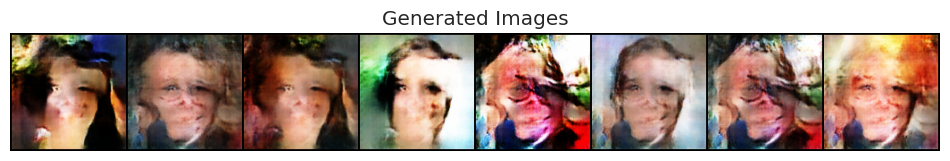

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [5/40], loss_g: 3.9830, loss_d: 0.5356, real_score: 0.8577, fake_score: 0.1428


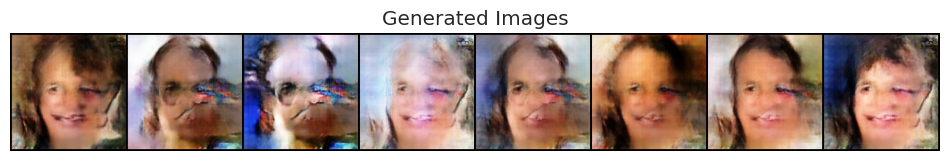

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [6/40], loss_g: 4.1573, loss_d: 0.5035, real_score: 0.8717, fake_score: 0.1282


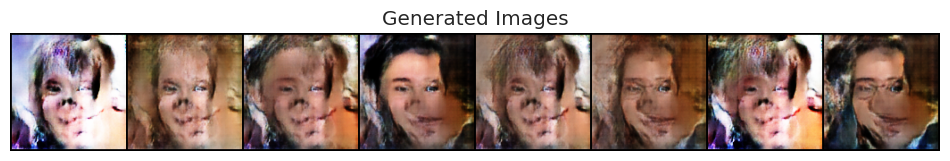

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [7/40], loss_g: 4.2832, loss_d: 0.4647, real_score: 0.8836, fake_score: 0.1156


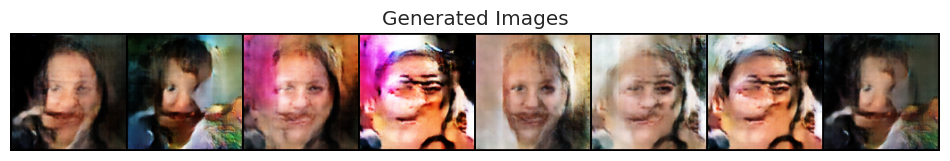

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [8/40], loss_g: 4.3522, loss_d: 0.4638, real_score: 0.8866, fake_score: 0.1130


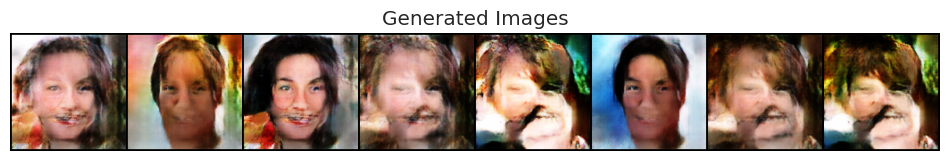

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [9/40], loss_g: 4.3757, loss_d: 0.4504, real_score: 0.8911, fake_score: 0.1090


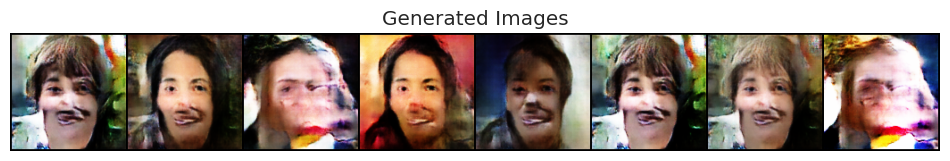

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [10/40], loss_g: 4.3695, loss_d: 0.4665, real_score: 0.8898, fake_score: 0.1104


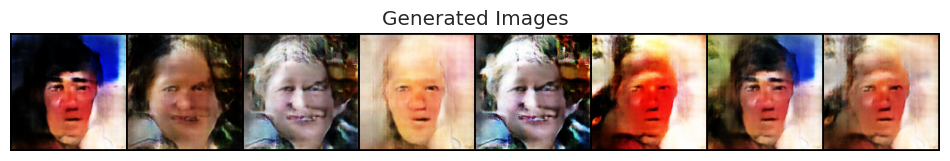

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [11/40], loss_g: 4.3019, loss_d: 0.4420, real_score: 0.8955, fake_score: 0.1044


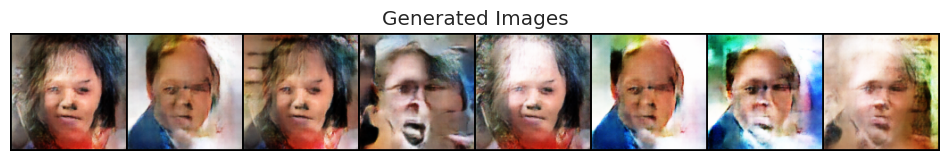

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [12/40], loss_g: 4.4447, loss_d: 0.4345, real_score: 0.9000, fake_score: 0.0998


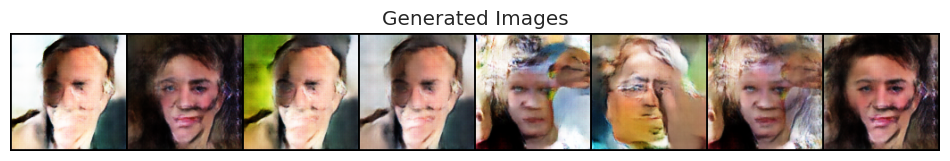

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [13/40], loss_g: 4.4635, loss_d: 0.4233, real_score: 0.9037, fake_score: 0.0964


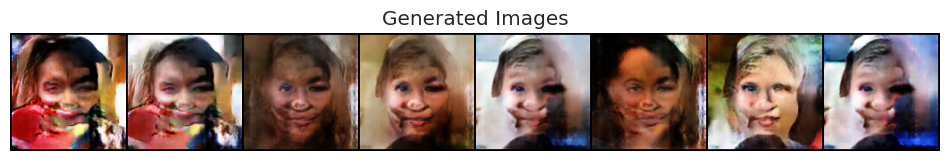

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [14/40], loss_g: 4.4830, loss_d: 0.4246, real_score: 0.9044, fake_score: 0.0955


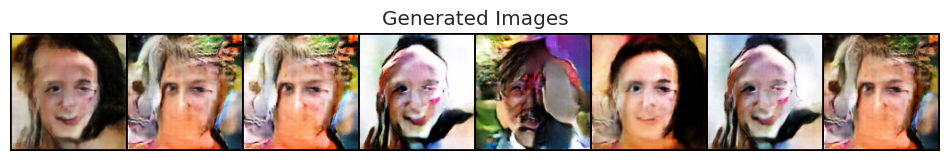

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [15/40], loss_g: 4.4979, loss_d: 0.4251, real_score: 0.9048, fake_score: 0.0951


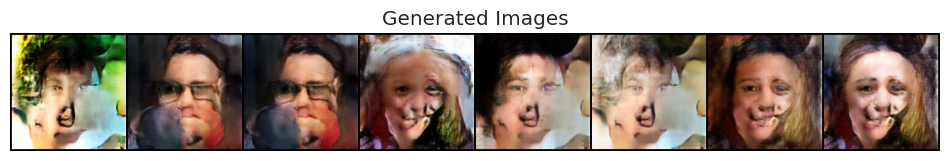

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [16/40], loss_g: 4.4922, loss_d: 0.4149, real_score: 0.9087, fake_score: 0.0915


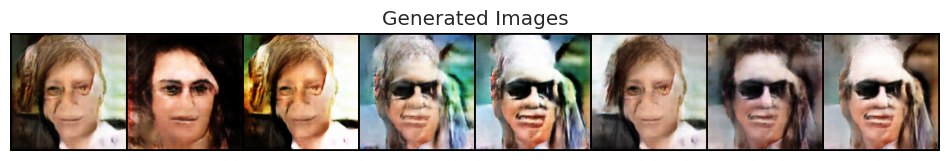

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [17/40], loss_g: 4.3391, loss_d: 0.4248, real_score: 0.9062, fake_score: 0.0939


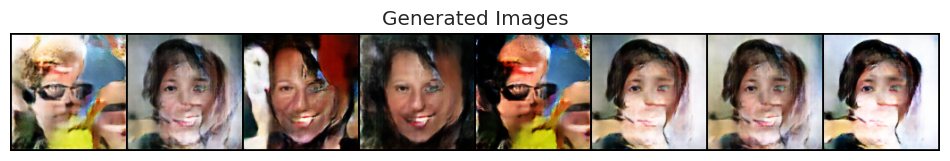

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [18/40], loss_g: 4.3550, loss_d: 0.4236, real_score: 0.9061, fake_score: 0.0944


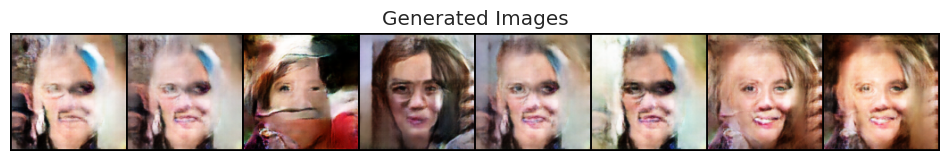

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [19/40], loss_g: 4.3489, loss_d: 0.4158, real_score: 0.9079, fake_score: 0.0913


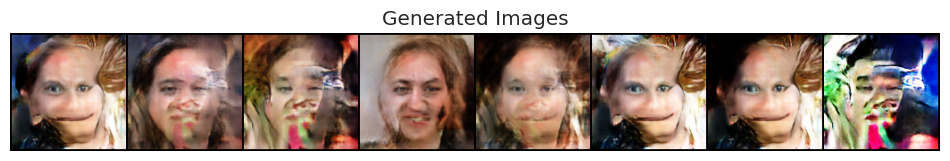

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [20/40], loss_g: 4.3420, loss_d: 0.4056, real_score: 0.9123, fake_score: 0.0878


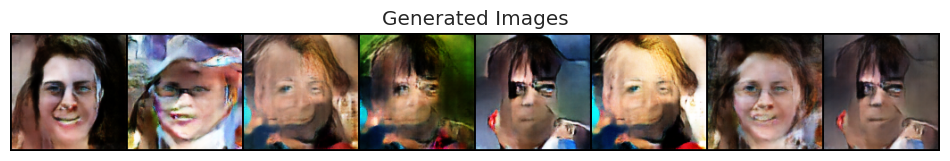

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [21/40], loss_g: 4.4686, loss_d: 0.4148, real_score: 0.9110, fake_score: 0.0889


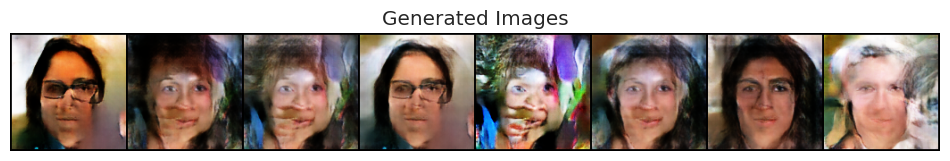

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [22/40], loss_g: 4.4899, loss_d: 0.3941, real_score: 0.9164, fake_score: 0.0835


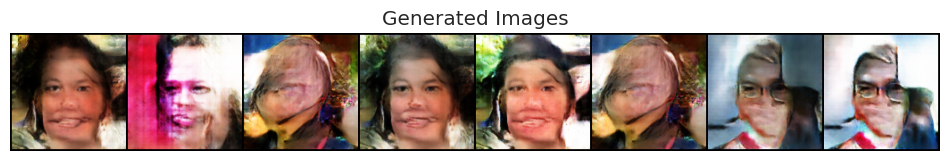

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [23/40], loss_g: 4.5229, loss_d: 0.3807, real_score: 0.9207, fake_score: 0.0791


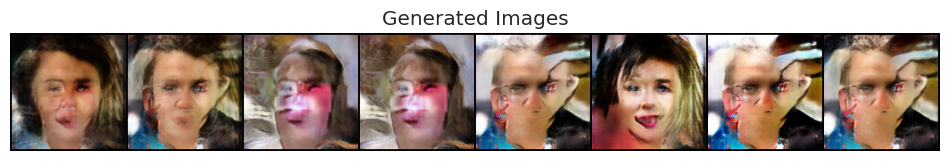

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [24/40], loss_g: 4.4603, loss_d: 0.4124, real_score: 0.9128, fake_score: 0.0875


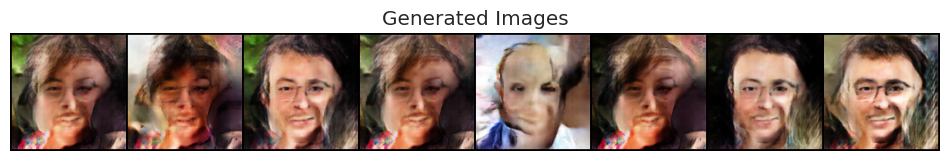

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [25/40], loss_g: 4.3685, loss_d: 0.3933, real_score: 0.9166, fake_score: 0.0834


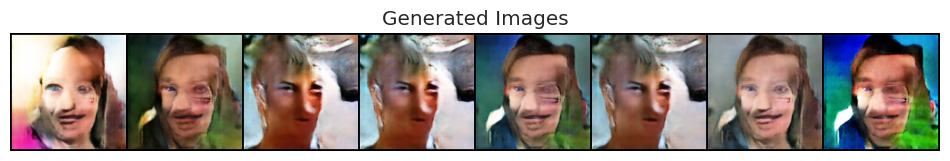

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [26/40], loss_g: 4.4797, loss_d: 0.4040, real_score: 0.9154, fake_score: 0.0847


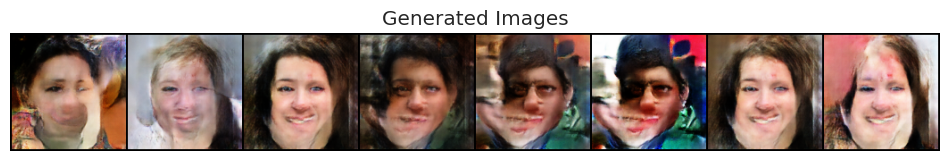

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [27/40], loss_g: 4.4763, loss_d: 0.3858, real_score: 0.9199, fake_score: 0.0802


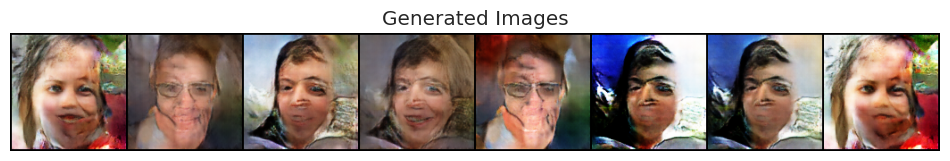

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [28/40], loss_g: 4.4633, loss_d: 0.3829, real_score: 0.9202, fake_score: 0.0798


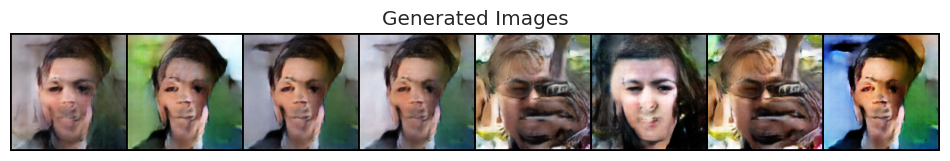

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [29/40], loss_g: 4.5597, loss_d: 0.3957, real_score: 0.9188, fake_score: 0.0814


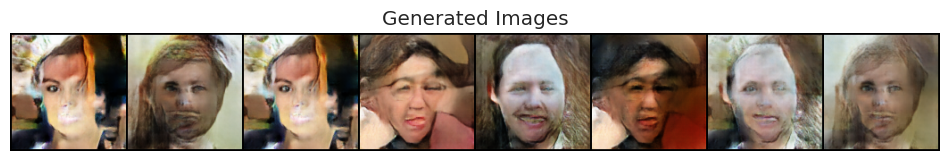

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [30/40], loss_g: 4.4075, loss_d: 0.3978, real_score: 0.9184, fake_score: 0.0815


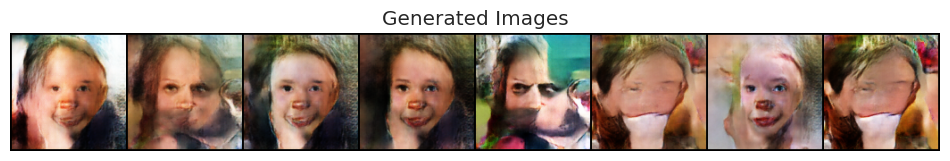

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [31/40], loss_g: 4.4217, loss_d: 0.3810, real_score: 0.9225, fake_score: 0.0776


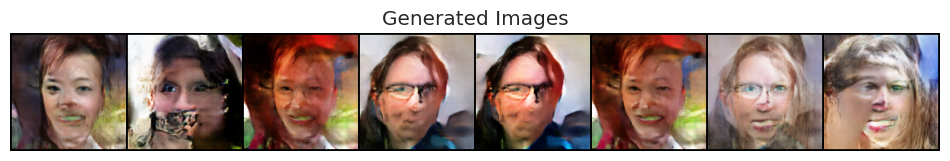

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [32/40], loss_g: 4.5260, loss_d: 0.3925, real_score: 0.9208, fake_score: 0.0789


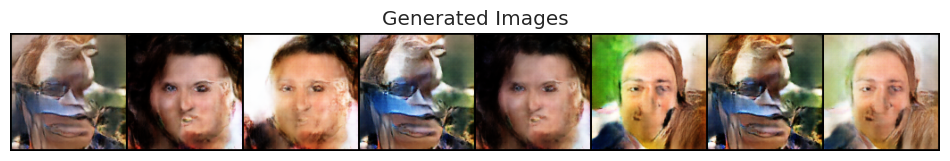

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [33/40], loss_g: 4.4563, loss_d: 0.3840, real_score: 0.9212, fake_score: 0.0794


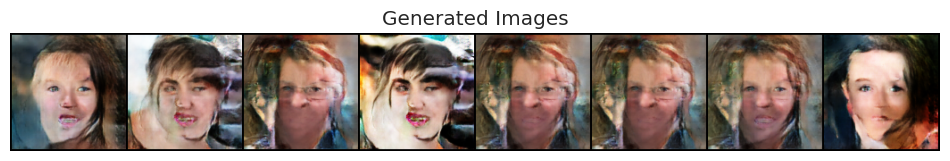

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [34/40], loss_g: 4.4351, loss_d: 0.3809, real_score: 0.9224, fake_score: 0.0774


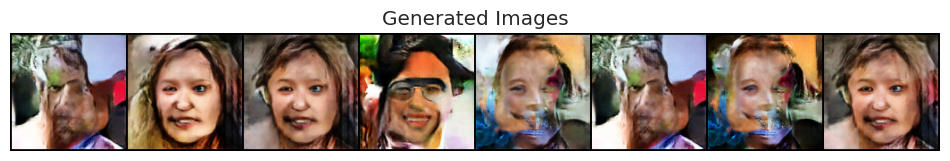

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [35/40], loss_g: 4.5859, loss_d: 0.3790, real_score: 0.9266, fake_score: 0.0732


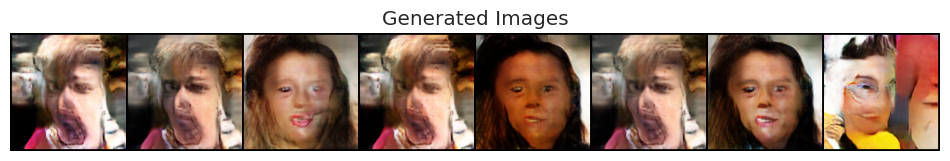

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [36/40], loss_g: 4.4684, loss_d: 0.3693, real_score: 0.9274, fake_score: 0.0725


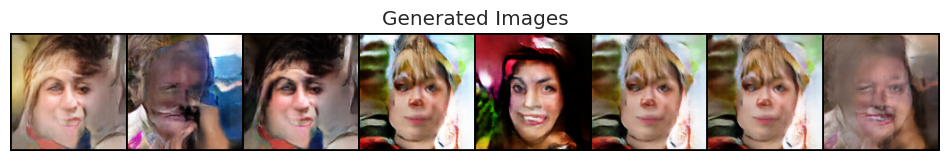

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [37/40], loss_g: 4.3571, loss_d: 0.3781, real_score: 0.9232, fake_score: 0.0768


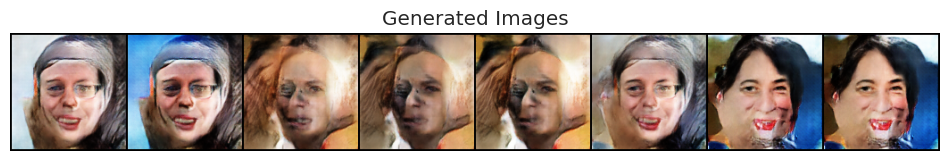

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [38/40], loss_g: 4.3732, loss_d: 0.3831, real_score: 0.9223, fake_score: 0.0772


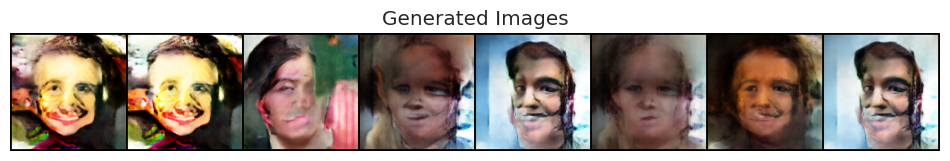

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [39/40], loss_g: 4.4439, loss_d: 0.3718, real_score: 0.9272, fake_score: 0.0731


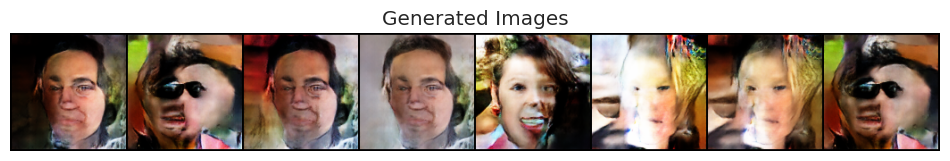

  0%|          | 0/813 [00:00<?, ?it/s]

Epoch [40/40], loss_g: 4.3811, loss_d: 0.3654, real_score: 0.9290, fake_score: 0.0706


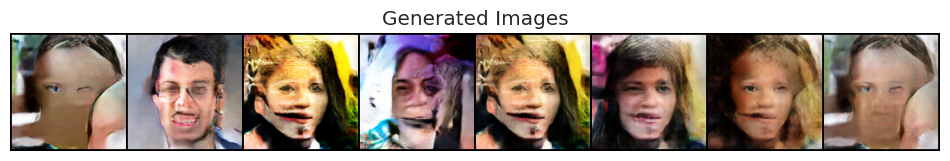

In [17]:
history = fit(model, criterion, epochs, lr)

## Loss and scores

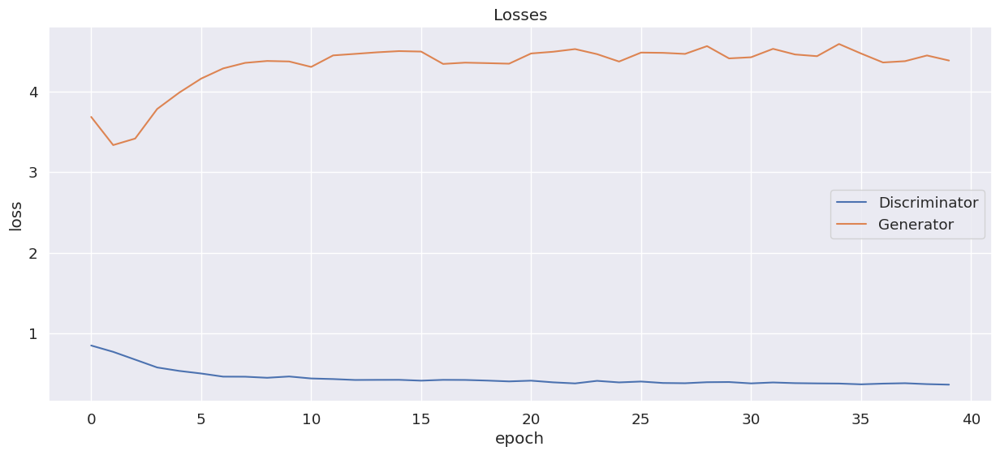

In [18]:
losses_g, losses_d, real_scores, fake_scores = history

plt.figure(figsize=(15, 6))
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

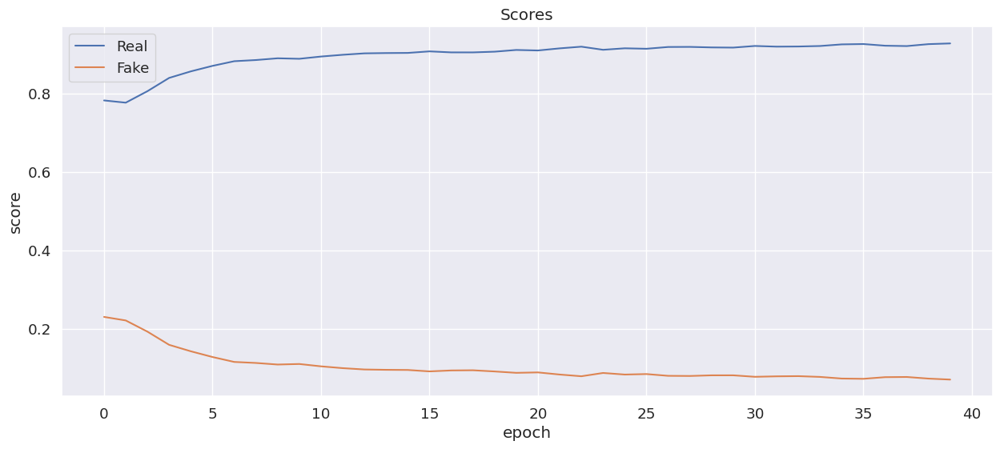

In [19]:
plt.figure(figsize=(15, 6))

plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

## Image generation

Let's see the result

In [32]:
n_images = 40

fixed_latent = torch.randn(n_images, latent_size, 1, 1, device=device)
fake_images = model["generator"](fixed_latent)

In [23]:
def show_images(generated):
    plt.figure(figsize=(12, 12))
    plt.axis("off")
    plt.title("Generated Images")
    plt.imshow(np.transpose(make_grid(generated.to(device), padding=2, normalize=True).cpu(),(1,2,0)))

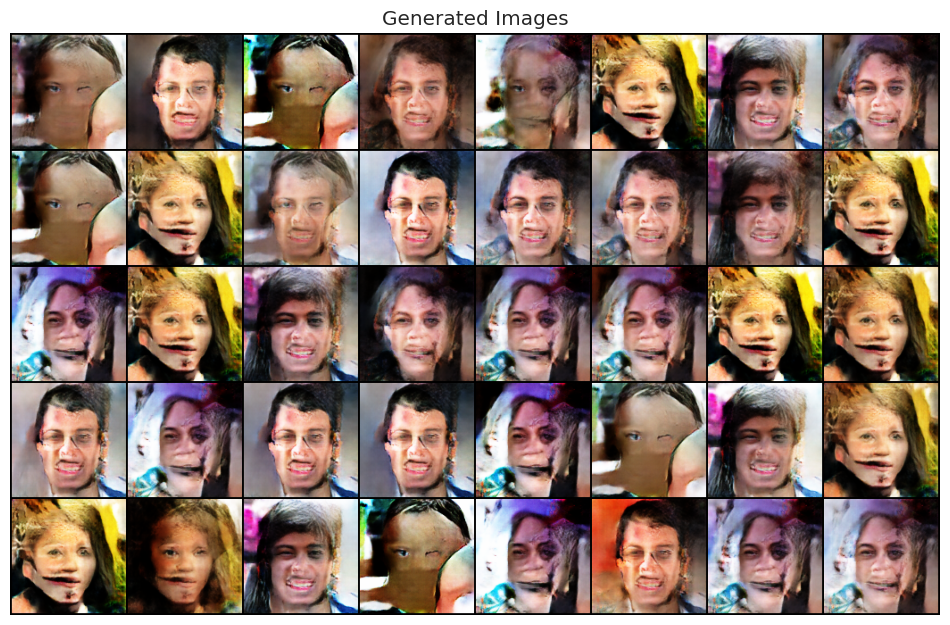

In [33]:
show_images(fake_images)

## What can be said about the quality?

The quality of the faces is not perfect. Non-the-less, considering a rather straightforward approach, the result is impressive. An algorithm was able to generate face-like shapes from a noise after 40 epochs. Despite the "impressionism", human features are clearly visible. The algorithm recognizes eyes, nose, mouth, and face shape.

There are two key problems.

The first is the so-called mode collapse. GAN generates visually similar images, there is little variability. Smoothing labels improved the situation a bit, but mode collapse is still present in the final version. The second problem is poor image quality.

## Ideas for later improvement: 

https://developers.google.com/machine-learning/gan/problems

https://datascience.stackexchange.com/questions/51276/gan-am-i-seeing-mode-collapse-common-fixes-not-working

Ideas for improvement:
1) changing the structure of the model itself (generator, discriminator)
2) setting good initial weights

## Leave-one-out-1-NN classifier accuracy

It is not always convenient to evaluate the quality of generated pictures by eye. As an alternative, we can implement the following approach:
  * Generate as many fake images as there are real ones in the training sample. Assign a class label of 0 to the fake ones and 1 to the real ones.
  * Build leave-one-out evaluation: train 1NN Classifier (`sklearn.neighbors.KNeighborsClassifier(n_neighbors=1)`) to predict the class on all but one object, check the quality (accuracy) on the remaining object. 

In [34]:
print(len(train_dl.dataset))
n = len(train_dl.dataset)

52001


In [40]:
n_images = n//100

fixed_latent = torch.randn(n_images, latent_size, 1, 1, device=device)
fake_images = model["generator"].to(device)(fixed_latent)
real_images = next(iter(get_dataloader(image_size, n_images)))[0]

In [41]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import LeaveOneOut
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

zeros = torch.zeros(n_images, 1, device='cpu')
ones = torch.ones(n_images, 1, device='cpu')

X = torch.cat((fake_images.cpu(), real_images.cpu())).detach().numpy().reshape(-1, 3*128*128)
y = torch.cat((zeros, ones)).detach().numpy()

knc = KNeighborsClassifier(n_neighbors=1)
loo = LeaveOneOut()

accuracy_score_history = []
predictions = []
targets = []
for train_index, test_index in tqdm(loo.split(X)):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    knc.fit(X_train, np.ravel(y_train))
    pred = knc.predict(X_test)
    accuracy_score_history.append(accuracy_score(pred, y_test))
    predictions.append(pred)
    targets.append(y_test)

    
print('Mean accuracy =', np.mean(accuracy_score_history))

0it [00:00, ?it/s]

Mean accuracy = 0.9625


We need an accuracy equal to 0.5 - i.e., the discriminator cannot distinguish the real picture from the generated one. Our result is far from good (the resulting images speak for themselves).

### Distribution visualisation

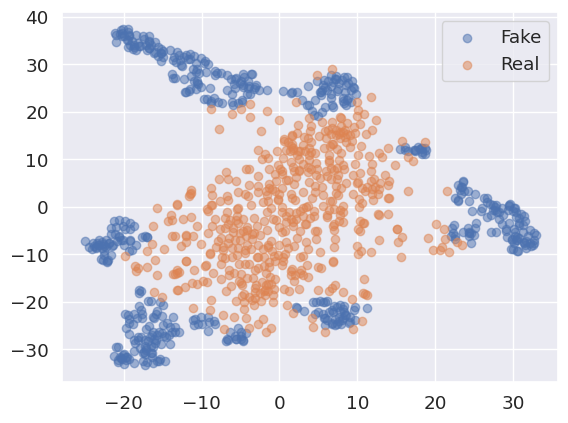

In [45]:
import numpy as np
from sklearn.manifold import TSNE
X_embedded = TSNE(n_components=2, learning_rate='auto',
                  init='random').fit_transform(X)
plt.scatter(X_embedded[:n_images, 0], X_embedded[:n_images, 1], label='Fake', alpha=0.5)
plt.scatter(X_embedded[n_images:, 0], X_embedded[n_images:, 1], label='Real', alpha=0.5)
plt.legend()
plt.show()

A lot of room for improvement!